# Edge Detection Benchmark (Inference-Only)

This notebook runs **inference-only** edge detection on a fixed 10-image sample from `./datasets/HED_Small/test/images/`.

Models / methods:
- **XDoG** (classical, analytic)
- **HED** (pretrained, PyTorch; auto-download)
- **RCF** (pretrained, PyTorch; auto-download via Google Drive)
- **DexiNed** (pretrained, PyTorch; auto-download via Google Drive)

Hard constraints satisfied:
- **No training / no fine-tuning** (strict inference-only).
- Runs in Kaggle/Colab (GPU optional).
- Deep models use **PyTorch**; XDoG uses **OpenCV / scikit-image**.
- If a model fails to load, it is **skipped gracefully** and the rest still runs.

In [1]:
# ===== Config =====
from pathlib import Path

# Notebook is in ./Comparison, so project root is one level up
PROJECT_ROOT = Path('..')

DATASET_ROOT = PROJECT_ROOT / 'datasets' / 'HED_Medium'
SPLIT = 'test'  # train | val | test
SEED = 123
SAMPLE_SIZE = 10

MAX_SIDE = 512           # keep aspect ratio; longest side <= MAX_SIDE
PAD_MULTIPLE = 32        # pad H/W to multiple of this for CNNs
THRESHOLDS = [0.3, 0.5, 0.7]

OUTPUTS_DIR = Path('./outputs')
OUTPUTS_DIR_MODELS = OUTPUTS_DIR
OUTPUTS_DIR_COMPARISONS = OUTPUTS_DIR / 'comparisons'
OUTPUTS_DIR_FINAL = OUTPUTS_DIR / 'final'

# Download/cache folders
MODELS_DIR = PROJECT_ROOT / 'models'
CHECKPOINTS_DIR = MODELS_DIR
REPOS_DIR = MODELS_DIR / '_repos'

In [2]:
# ===== Installs (Kaggle/Colab) + Imports + Seed =====
import os
import sys
import math
import json
import random
import shutil
import subprocess
from dataclasses import dataclass

def _pip_install(pkgs):
    try:
        import importlib  # noqa: F401
        # We still install to be safe in Colab/Kaggle.
        subprocess.run([sys.executable, '-m', 'pip', 'install', '-q'] + pkgs, check=False)
    except Exception as e:
        print('pip install skipped/failed:', e)

_pip_install([
    'numpy',
    'pillow',
    'matplotlib',
    'pandas',
    'tqdm',
    'opencv-python-headless',
    'scikit-image',
    'gdown',
])

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import cv2
from skimage.filters import gaussian

import torch
import torch.nn as nn
import torch.nn.functional as F

def set_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

set_seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', DEVICE)

Device: cuda


In [3]:
# ===== Dataset indexing + fixed 10-image sample =====
IMG_DIR = DATASET_ROOT / SPLIT / 'images'
GT_DIR = DATASET_ROOT / SPLIT / 'edges'

assert IMG_DIR.exists(), f'Missing images dir: {IMG_DIR}'
assert GT_DIR.exists(), f'Missing edges dir: {GT_DIR}'

IMG_EXTS = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'}

def list_images(img_dir: Path):
    paths = [p for p in img_dir.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS]
    paths.sort(key=lambda p: p.name)
    return paths

def find_matching_gt(img_path: Path, gt_dir: Path) -> Path:
    # Prefer exact filename match; fallback to stem match across common extensions
    exact = gt_dir / img_path.name
    if exact.exists():
        return exact
    stem = img_path.stem
    for ext in IMG_EXTS:
        cand = gt_dir / f'{stem}{ext}'
        if cand.exists():
            return cand
    raise FileNotFoundError(f'No GT edge mask for {img_path.name} under {gt_dir}')

all_images = list_images(IMG_DIR)
assert len(all_images) >= SAMPLE_SIZE, f'Need at least {SAMPLE_SIZE} images, found {len(all_images)} in {IMG_DIR}'

rng = random.Random(SEED)
sample_images = rng.sample(all_images, SAMPLE_SIZE)
sample_images = sorted(sample_images, key=lambda p: p.name)  # stable order for display

sample_pairs = []
for img_path in sample_images:
    gt_path = find_matching_gt(img_path, GT_DIR)
    sample_pairs.append((img_path, gt_path))

print(f'Selected {len(sample_pairs)} images from:', IMG_DIR)
for p, g in sample_pairs[:3]:
    print(' -', p.name, '->', g.name)

Selected 10 images from: ..\datasets\HED_Medium\test\images
 - hedbsds_train_000455.png -> hedbsds_train_000455.png
 - hedbsds_train_000522.png -> hedbsds_train_000522.png
 - hedbsds_train_000971.png -> hedbsds_train_000971.png


In [4]:
# ===== Common utilities (I/O, resize, padding, normalization) =====
def ensure_dir(path: Path):
    path.mkdir(parents=True, exist_ok=True)
    return path

def read_rgb(path: Path) -> np.ndarray:
    img = Image.open(path).convert('RGB')
    return np.array(img)

def read_gt_mask(path: Path) -> np.ndarray:
    # Accept 0/255 or any grayscale; normalize to 0..1 float
    m = Image.open(path).convert('L')
    arr = np.array(m).astype(np.float32)
    if arr.max() > 1.5:
        arr = arr / 255.0
    arr = np.clip(arr, 0.0, 1.0)
    return arr

def resize_keep_aspect_max_side(h: int, w: int, max_side: int):
    if max(h, w) <= max_side:
        return h, w, 1.0
    scale = max_side / float(max(h, w))
    new_h = int(round(h * scale))
    new_w = int(round(w * scale))
    new_h = max(1, new_h)
    new_w = max(1, new_w)
    return new_h, new_w, scale

def pad_to_multiple(img: np.ndarray, multiple: int, pad_value: float = 0.0):
    # img: HxWxC or HxW
    if img.ndim == 2:
        h, w = img.shape
        c = None
    else:
        h, w, c = img.shape
    pad_h = (multiple - (h % multiple)) % multiple
    pad_w = (multiple - (w % multiple)) % multiple
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left
    if img.ndim == 2:
        out = np.pad(img, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=pad_value)
    else:
        out = np.pad(img, ((pad_top, pad_bottom), (pad_left, pad_right), (0, 0)), mode='constant', constant_values=pad_value)
    pad = (pad_top, pad_bottom, pad_left, pad_right)
    return out, pad

def unpad(img: np.ndarray, pad):
    pad_top, pad_bottom, pad_left, pad_right = pad
    if pad_top == pad_bottom == pad_left == pad_right == 0:
        return img
    if img.ndim == 2:
        return img[pad_top: img.shape[0] - pad_bottom, pad_left: img.shape[1] - pad_right]
    return img[pad_top: img.shape[0] - pad_bottom, pad_left: img.shape[1] - pad_right, :]

def to_torch_image(rgb_uint8: np.ndarray) -> torch.Tensor:
    # HxWx3 uint8 -> 1x3xHxW float in 0..1
    ten = torch.from_numpy(rgb_uint8.astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    return ten

def save_prob_png(prob01: np.ndarray, path: Path):
    # prob01: HxW float 0..1
    arr = (np.clip(prob01, 0.0, 1.0) * 255.0).astype(np.uint8)
    ensure_dir(path.parent)
    Image.fromarray(arr, mode='L').save(path)

def normalize01(x: np.ndarray) -> np.ndarray:
    x = x.astype(np.float32)
    mn = float(np.min(x))
    mx = float(np.max(x))
    if mx - mn < 1e-8:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn)

In [5]:
# ===== Download helpers =====
def run_cmd(cmd, cwd: Path | None = None):
    res = subprocess.run(cmd, cwd=str(cwd) if cwd else None, check=False, capture_output=True, text=True)
    return res.returncode, res.stdout, res.stderr

def ensure_git_repo(repo_url: str, dest_dir: Path):
    if dest_dir.exists() and (dest_dir / '.git').exists():
        return True
    ensure_dir(dest_dir.parent)
    code, out, err = run_cmd(['git', 'clone', '--depth', '1', repo_url, str(dest_dir)])
    if code != 0:
        print('git clone failed:', repo_url)
        print(err.strip()[:2000])
        return False
    return True

def ensure_gdown_file(file_id: str, out_path: Path) -> bool:
    if out_path.exists() and out_path.stat().st_size > 0:
        return True
    ensure_dir(out_path.parent)
    try:
        import gdown
        url = f'https://drive.google.com/uc?id={file_id}'
        gdown.download(url, str(out_path), quiet=False)
    except Exception as e:
        print('gdown download failed:', e)
        return False
    return out_path.exists() and out_path.stat().st_size > 0

In [6]:
# ===== HED (PyTorch, pretrained) =====
# Based on a public PyTorch reimplementation that downloads official weights.
# We keep it inference-only and device-agnostic.

class HEDNetwork(nn.Module):
    def __init__(self, model_name: str = 'bsds500'):
        super().__init__()
        self.model_name = model_name

        self.netVggOne = nn.Sequential(
            nn.Conv2d(3, 64, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(64, 64, 3, 1, 1), nn.ReLU(inplace=False),
        )
        self.netVggTwo = nn.Sequential(
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(128, 128, 3, 1, 1), nn.ReLU(inplace=False),
        )
        self.netVggThr = nn.Sequential(
            nn.MaxPool2d(2, 2),
            nn.Conv2d(128, 256, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(256, 256, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(256, 256, 3, 1, 1), nn.ReLU(inplace=False),
        )
        self.netVggFou = nn.Sequential(
            nn.MaxPool2d(2, 2),
            nn.Conv2d(256, 512, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(512, 512, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(512, 512, 3, 1, 1), nn.ReLU(inplace=False),
        )
        self.netVggFiv = nn.Sequential(
            nn.MaxPool2d(2, 2),
            nn.Conv2d(512, 512, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(512, 512, 3, 1, 1), nn.ReLU(inplace=False),
            nn.Conv2d(512, 512, 3, 1, 1), nn.ReLU(inplace=False),
        )

        self.netScoreOne = nn.Conv2d(64, 1, 1)
        self.netScoreTwo = nn.Conv2d(128, 1, 1)
        self.netScoreThr = nn.Conv2d(256, 1, 1)
        self.netScoreFou = nn.Conv2d(512, 1, 1)
        self.netScoreFiv = nn.Conv2d(512, 1, 1)

        self.netCombine = nn.Sequential(nn.Conv2d(5, 1, 1), nn.Sigmoid())

        # Download pretrained weights
        url = f'http://content.sniklaus.com/github/pytorch-hed/network-{model_name}.pytorch'
        try:
            sd = torch.hub.load_state_dict_from_url(url=url, file_name=f'hed-{model_name}', map_location='cpu')
            # State dict keys are prefixed; map them to our module names
            mapped = {k.replace('module', 'net'): v for k, v in sd.items()}
            self.load_state_dict(mapped, strict=True)
            self._loaded = True
        except Exception as e:
            print('HED weight download/load failed:', e)
            self._loaded = False

    @property
    def loaded(self):
        return getattr(self, '_loaded', False)

    def forward(self, tenInput01: torch.Tensor) -> torch.Tensor:
        # tenInput01: Bx3xHxW in 0..1
        tenInput = tenInput01 * 255.0
        tenInput = tenInput[:, [2, 1, 0], :, :]  # RGB -> BGR
        mean_bgr = torch.tensor([104.00698793, 116.66876762, 122.67891434], device=tenInput.device, dtype=tenInput.dtype).view(1, 3, 1, 1)
        tenInput = tenInput - mean_bgr

        v1 = self.netVggOne(tenInput)
        v2 = self.netVggTwo(v1)
        v3 = self.netVggThr(v2)
        v4 = self.netVggFou(v3)
        v5 = self.netVggFiv(v4)

        s1 = self.netScoreOne(v1)
        s2 = self.netScoreTwo(v2)
        s3 = self.netScoreThr(v3)
        s4 = self.netScoreFou(v4)
        s5 = self.netScoreFiv(v5)

        H, W = tenInput.shape[2], tenInput.shape[3]
        s1 = F.interpolate(s1, size=(H, W), mode='bilinear', align_corners=False)
        s2 = F.interpolate(s2, size=(H, W), mode='bilinear', align_corners=False)
        s3 = F.interpolate(s3, size=(H, W), mode='bilinear', align_corners=False)
        s4 = F.interpolate(s4, size=(H, W), mode='bilinear', align_corners=False)
        s5 = F.interpolate(s5, size=(H, W), mode='bilinear', align_corners=False)

        out = self.netCombine(torch.cat([s1, s2, s3, s4, s5], dim=1))
        return out

def load_hed(device: torch.device):
    try:
        model = HEDNetwork('bsds500')
        if not model.loaded:
            return None
        model = model.to(device).eval()
        return model
    except Exception as e:
        print('HED init failed:', e)
        return None

hed_model = load_hed(DEVICE)
print('HED loaded:', hed_model is not None)

HED loaded: True


In [7]:
# ===== RCF (PyTorch, pretrained) =====
# Uses the public RCF-pytorch architecture naming and a pretrained checkpoint (Google Drive).

class RCFNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(2, stride=2, ceil_mode=True)
        self.maxpool4 = nn.MaxPool2d(2, stride=1, ceil_mode=True)

        # VGG-ish backbone
        self.conv1_1 = nn.Conv2d(3, 64, 3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv2_1 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, 3, padding=1)
        self.conv3_1 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, 3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, 3, padding=1)
        self.conv4_1 = nn.Conv2d(256, 512, 3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, 3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, 3, padding=1)
        # dilation=2 stage
        self.conv5_1 = nn.Conv2d(512, 512, 3, stride=1, padding=2, dilation=2)
        self.conv5_2 = nn.Conv2d(512, 512, 3, stride=1, padding=2, dilation=2)
        self.conv5_3 = nn.Conv2d(512, 512, 3, stride=1, padding=2, dilation=2)

        # side feature reductions
        self.conv1_1_down = nn.Conv2d(64, 21, 1)
        self.conv1_2_down = nn.Conv2d(64, 21, 1)
        self.conv2_1_down = nn.Conv2d(128, 21, 1)
        self.conv2_2_down = nn.Conv2d(128, 21, 1)
        self.conv3_1_down = nn.Conv2d(256, 21, 1)
        self.conv3_2_down = nn.Conv2d(256, 21, 1)
        self.conv3_3_down = nn.Conv2d(256, 21, 1)
        self.conv4_1_down = nn.Conv2d(512, 21, 1)
        self.conv4_2_down = nn.Conv2d(512, 21, 1)
        self.conv4_3_down = nn.Conv2d(512, 21, 1)
        self.conv5_1_down = nn.Conv2d(512, 21, 1)
        self.conv5_2_down = nn.Conv2d(512, 21, 1)
        self.conv5_3_down = nn.Conv2d(512, 21, 1)

        self.score_dsn1 = nn.Conv2d(21, 1, 1)
        self.score_dsn2 = nn.Conv2d(21, 1, 1)
        self.score_dsn3 = nn.Conv2d(21, 1, 1)
        self.score_dsn4 = nn.Conv2d(21, 1, 1)
        self.score_dsn5 = nn.Conv2d(21, 1, 1)
        self.score_final = nn.Conv2d(5, 1, 1)

    def forward(self, x01: torch.Tensor):
        # x01: Bx3xHxW in 0..1
        img_H, img_W = x01.shape[2], x01.shape[3]
        x = x01 * 255.0
        x = x[:, [2, 1, 0], :, :]  # RGB -> BGR
        mean_bgr = torch.tensor([104.00698793, 116.66876762, 122.67891434], device=x.device, dtype=x.dtype).view(1, 3, 1, 1)
        x = x - mean_bgr

        c11 = self.relu(self.conv1_1(x))
        c12 = self.relu(self.conv1_2(c11))
        p1 = self.maxpool(c12)

        c21 = self.relu(self.conv2_1(p1))
        c22 = self.relu(self.conv2_2(c21))
        p2 = self.maxpool(c22)

        c31 = self.relu(self.conv3_1(p2))
        c32 = self.relu(self.conv3_2(c31))
        c33 = self.relu(self.conv3_3(c32))
        p3 = self.maxpool(c33)

        c41 = self.relu(self.conv4_1(p3))
        c42 = self.relu(self.conv4_2(c41))
        c43 = self.relu(self.conv4_3(c42))
        p4 = self.maxpool4(c43)

        c51 = self.relu(self.conv5_1(p4))
        c52 = self.relu(self.conv5_2(c51))
        c53 = self.relu(self.conv5_3(c52))

        c11d = self.conv1_1_down(c11)
        c12d = self.conv1_2_down(c12)
        c21d = self.conv2_1_down(c21)
        c22d = self.conv2_2_down(c22)
        c31d = self.conv3_1_down(c31)
        c32d = self.conv3_2_down(c32)
        c33d = self.conv3_3_down(c33)
        c41d = self.conv4_1_down(c41)
        c42d = self.conv4_2_down(c42)
        c43d = self.conv4_3_down(c43)
        c51d = self.conv5_1_down(c51)
        c52d = self.conv5_2_down(c52)
        c53d = self.conv5_3_down(c53)

        so1 = self.score_dsn1(c11d + c12d)
        so2 = self.score_dsn2(c21d + c22d)
        so3 = self.score_dsn3(c31d + c32d + c33d)
        so4 = self.score_dsn4(c41d + c42d + c43d)
        so5 = self.score_dsn5(c51d + c52d + c53d)

        # Upsample side outputs to input resolution
        so1u = F.interpolate(so1, size=(img_H, img_W), mode='bilinear', align_corners=False)
        so2u = F.interpolate(so2, size=(img_H, img_W), mode='bilinear', align_corners=False)
        so3u = F.interpolate(so3, size=(img_H, img_W), mode='bilinear', align_corners=False)
        so4u = F.interpolate(so4, size=(img_H, img_W), mode='bilinear', align_corners=False)
        so5u = F.interpolate(so5, size=(img_H, img_W), mode='bilinear', align_corners=False)

        fuse = self.score_final(torch.cat([so1u, so2u, so3u, so4u, so5u], dim=1))

        results = [torch.sigmoid(t) for t in [so1u, so2u, so3u, so4u, so5u, fuse]]
        return results

def load_rcf(device: torch.device):
    # Pretrained model referenced by the repo README
    # https://github.com/meteorshowers/RCF-pytorch (Google Drive checkpoint)
    rcf_ckpt_id = '1TupHeoBKawrniDka0Hc64m3BG4OKG8nM'
    ckpt_path = CHECKPOINTS_DIR / 'rcf' / 'rcf_pretrained.pth'
    if not ensure_gdown_file(rcf_ckpt_id, ckpt_path):
        print('RCF checkpoint missing; skipping RCF')
        return None

    try:
        model = RCFNetwork().to(device).eval()
        sd = torch.load(str(ckpt_path), map_location='cpu')
        # Some checkpoints wrap state_dict
        if isinstance(sd, dict) and 'state_dict' in sd:
            sd = sd['state_dict']
        # Strip possible prefixes
        cleaned = {}
        for k, v in sd.items():
            nk = k
            for prefix in ['module.', 'model.']:
                if nk.startswith(prefix):
                    nk = nk[len(prefix):]
            cleaned[nk] = v
        missing, unexpected = model.load_state_dict(cleaned, strict=False)
        if len(unexpected) > 0:
            print('RCF unexpected keys (ok sometimes):', unexpected[:10])
        if len(missing) > 0:
            print('RCF missing keys (may be an issue):', missing[:10])
        return model
    except Exception as e:
        print('RCF load failed:', e)
        return None

rcf_model = load_rcf(DEVICE)
print('RCF loaded:', rcf_model is not None)

RCF loaded: True


C:\Users\imed\AppData\Local\Temp\ipykernel_22648\1920983381.py:122: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sd = torch.load(str(ckpt_path), map_location='cpu')


In [8]:
# ===== DexiNed (PyTorch, pretrained) =====
def load_dexined(device: torch.device):
    # DexiNed repo provides a Google Drive checkpoint in README.
    repo_url = 'https://github.com/xavysp/DexiNed.git'
    repo_dir = REPOS_DIR / 'DexiNed'
    if not ensure_git_repo(repo_url, repo_dir):
        print('DexiNed repo missing; skipping DexiNed')
        return None

    # Checkpoint ID from DexiNed README
    ckpt_id = '1V56vGTsu7GYiQouCIKvTWl5UKCZ6yCNu'
    ckpt_path = CHECKPOINTS_DIR / 'dexined' / 'dexined_biped.pth'
    if not ensure_gdown_file(ckpt_id, ckpt_path):
        print('DexiNed checkpoint missing; skipping DexiNed')
        return None

    try:
        sys.path.insert(0, str(repo_dir))
        from model import DexiNed  # type: ignore

        model = DexiNed().to(device).eval()
        sd = torch.load(str(ckpt_path), map_location='cpu')
        if isinstance(sd, dict) and 'state_dict' in sd:
            sd = sd['state_dict']
        cleaned = {}
        for k, v in sd.items():
            nk = k
            for prefix in ['module.', 'model.']:
                if nk.startswith(prefix):
                    nk = nk[len(prefix):]
            cleaned[nk] = v
        missing, unexpected = model.load_state_dict(cleaned, strict=False)
        if len(unexpected) > 0:
            print('DexiNed unexpected keys (ok sometimes):', unexpected[:10])
        if len(missing) > 0:
            print('DexiNed missing keys (may be an issue):', missing[:10])
        return model
    except Exception as e:
        print('DexiNed load failed:', e)
        return None

dexined_model = load_dexined(DEVICE)
print('DexiNed loaded:', dexined_model is not None)

C:\Users\imed\AppData\Local\Temp\ipykernel_22648\259063699.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sd = torch.load(str(ckpt_path), map_location='cpu')


DexiNed loaded: True


In [9]:
# ===== Predictors (HED / RCF / DexiNed / XDoG) =====
@torch.no_grad()
def _predict_deep_single_channel(model_name: str, model, rgb_uint8: np.ndarray, device: torch.device) -> np.ndarray:
    # Returns HxW prob map in 0..1 at original input size
    H0, W0 = rgb_uint8.shape[0], rgb_uint8.shape[1]

    new_h, new_w, _ = resize_keep_aspect_max_side(H0, W0, MAX_SIDE)
    rgb_resized = np.array(Image.fromarray(rgb_uint8).resize((new_w, new_h), resample=Image.BILINEAR))

    rgb_padded, pad = pad_to_multiple(rgb_resized, PAD_MULTIPLE, pad_value=0)
    ten = to_torch_image(rgb_padded).to(device)

    if model_name == 'HED':
        out = model(ten)  # Bx1xHxW
        prob = out[0, 0].float().detach().cpu().numpy()
    elif model_name == 'RCF':
        outs = model(ten)
        prob = outs[-1][0, 0].float().detach().cpu().numpy()
    elif model_name == 'DexiNed':
        # DexiNed expects BGR order + mean subtraction in 0..255 space.
        ten_bgr = ten * 255.0
        ten_bgr = ten_bgr[:, [2, 1, 0], :, :]  # RGB -> BGR
        mean_bgr = torch.tensor([103.939, 116.779, 123.68], device=ten_bgr.device, dtype=ten_bgr.dtype).view(1, 3, 1, 1)
        ten_bgr = ten_bgr - mean_bgr
        outs = model(ten_bgr)
        prob = torch.sigmoid(outs[-1])[0, 0].float().detach().cpu().numpy()
    else:
        raise ValueError(f'Unknown deep model: {model_name}')

    prob = unpad(prob, pad)
    prob = np.clip(prob, 0.0, 1.0)

    # Resize back to original size for saving/metrics
    prob_full = np.array(Image.fromarray((prob * 255).astype(np.uint8)).resize((W0, H0), resample=Image.BILINEAR)).astype(np.float32) / 255.0
    return np.clip(prob_full, 0.0, 1.0)

def predict_hed(rgb_uint8: np.ndarray) -> np.ndarray:
    if hed_model is None:
        raise RuntimeError('HED unavailable')
    return _predict_deep_single_channel('HED', hed_model, rgb_uint8, DEVICE)

def predict_rcf(rgb_uint8: np.ndarray) -> np.ndarray:
    if rcf_model is None:
        raise RuntimeError('RCF unavailable')
    return _predict_deep_single_channel('RCF', rcf_model, rgb_uint8, DEVICE)

def predict_dexined(rgb_uint8: np.ndarray) -> np.ndarray:
    if dexined_model is None:
        raise RuntimeError('DexiNed unavailable')
    return _predict_deep_single_channel('DexiNed', dexined_model, rgb_uint8, DEVICE)

def predict_xdog(rgb_uint8: np.ndarray, sigma: float = 0.7, k: float = 1.6, tau: float = 0.98, eps: float = 0.01, phi: float = 10.0) -> np.ndarray:
    # XDoG: Extended Difference of Gaussians (soft edge map in 0..1)
    # Reference-style implementation; kept simple and stable.
    gray = cv2.cvtColor(rgb_uint8, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

    new_h, new_w, _ = resize_keep_aspect_max_side(gray.shape[0], gray.shape[1], MAX_SIDE)
    gray_resized = cv2.resize(gray, (new_w, new_h), interpolation=cv2.INTER_AREA)

    g1 = gaussian(gray_resized, sigma=sigma, preserve_range=True)
    g2 = gaussian(gray_resized, sigma=sigma * k, preserve_range=True)
    dog = g1 - tau * g2

    # Soft thresholding via tanh (produces a probability-like map)
    xdog = np.where(dog >= eps, 1.0, 1.0 + np.tanh(phi * (dog - eps)))
    xdog = normalize01(xdog)

    # Resize back to original size
    H0, W0 = gray.shape
    xdog_full = cv2.resize(xdog.astype(np.float32), (W0, H0), interpolation=cv2.INTER_LINEAR)
    return np.clip(xdog_full, 0.0, 1.0)

Inference:   0%|          | 0/10 [00:00<?, ?it/s]

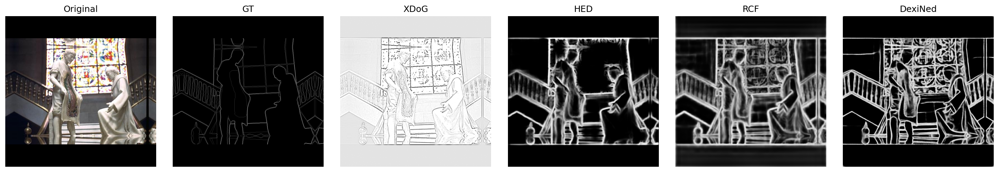

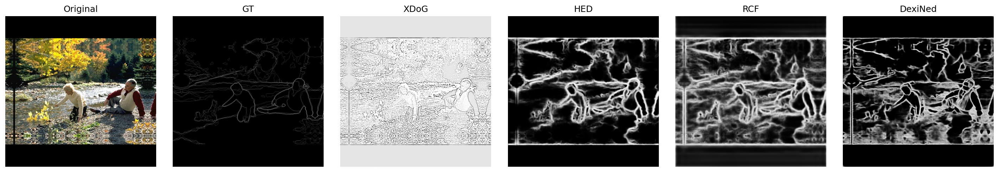

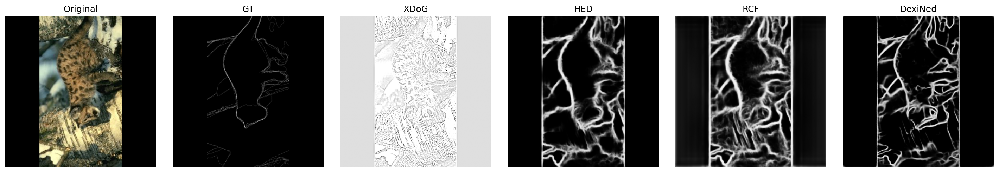

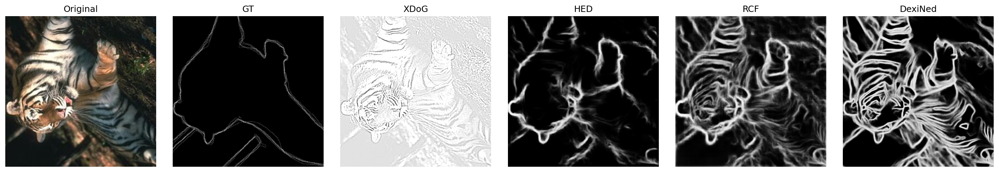

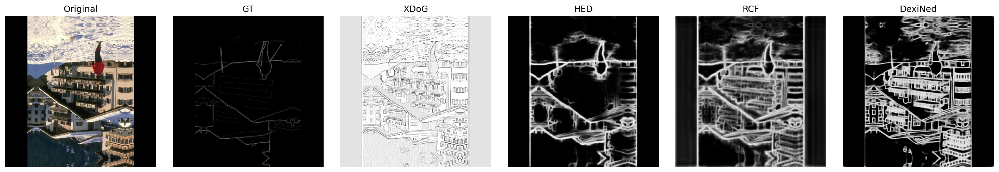

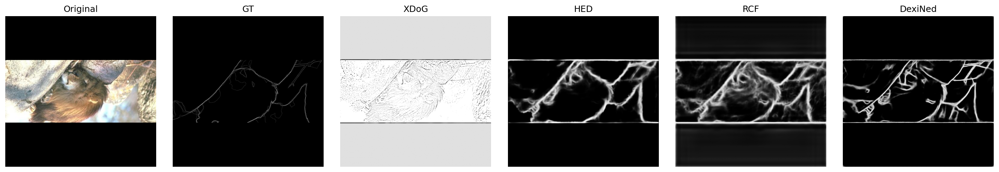

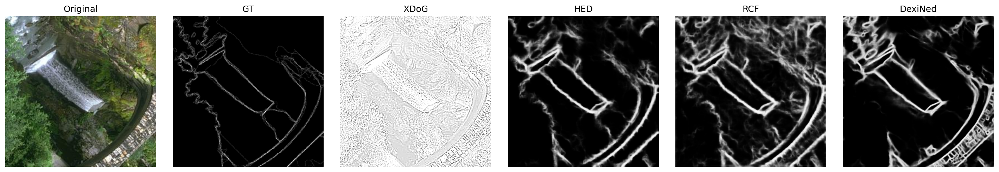

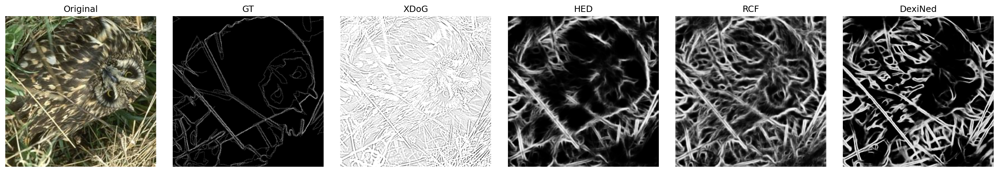

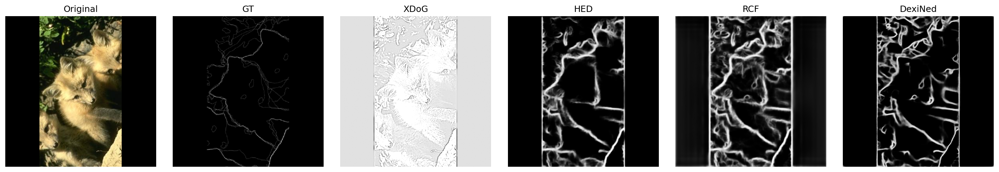

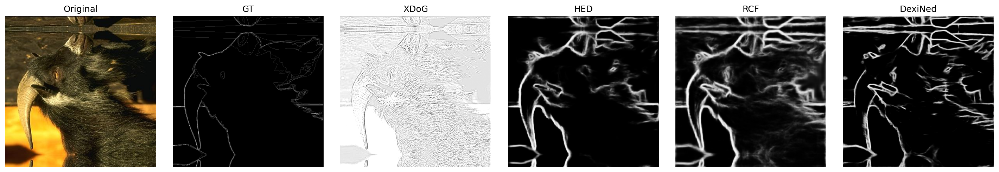

Saved per-model outputs under: E:\Edge Detection\Comparison\outputs
Saved grids under: E:\Edge Detection\Comparison\outputs\comparisons


In [10]:
# ===== Inference on the 10-image sample (save outputs + grids; show results) =====
MODEL_ORDER = ['XDoG', 'HED', 'RCF', 'DexiNed']

predictors = {
    'XDoG': lambda rgb: predict_xdog(rgb),
    'HED': (lambda rgb: predict_hed(rgb)) if hed_model is not None else None,
    'RCF': (lambda rgb: predict_rcf(rgb)) if rcf_model is not None else None,
    'DexiNed': (lambda rgb: predict_dexined(rgb)) if dexined_model is not None else None,
}

for name in MODEL_ORDER:
    if predictors.get(name) is None:
        print(f'[SKIP] {name}: unavailable')

ensure_dir(OUTPUTS_DIR_COMPARISONS)
ensure_dir(OUTPUTS_DIR_FINAL)

# Store predictions in-memory for metrics
pred_cache: dict[str, dict[str, np.ndarray]] = {name: {} for name in MODEL_ORDER}
gt_cache: dict[str, np.ndarray] = {}

def make_and_save_grid(stem: str, rgb: np.ndarray, gt01: np.ndarray, preds: dict[str, np.ndarray], out_path: Path):
    cols = ['Original', 'GT', 'XDoG', 'HED', 'RCF', 'DexiNed']
    fig, axes = plt.subplots(1, len(cols), figsize=(3.2 * len(cols), 3.2), dpi=150)

    def _show(ax, title, img, is_rgb=False):
        ax.set_title(title)
        ax.axis('off')
        if img is None:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center')
            return
        if is_rgb:
            ax.imshow(img)
        else:
            ax.imshow(img, cmap='gray', vmin=0.0, vmax=1.0)

    _show(axes[0], 'Original', rgb, is_rgb=True)
    _show(axes[1], 'GT', gt01, is_rgb=False)

    for i, name in enumerate(['XDoG', 'HED', 'RCF', 'DexiNed'], start=2):
        _show(axes[i], name, preds.get(name), is_rgb=False)

    fig.tight_layout()
    ensure_dir(out_path.parent)
    fig.savefig(out_path, bbox_inches='tight')
    plt.show()
    plt.close(fig)

for img_path, gt_path in tqdm(sample_pairs, desc='Inference'):
    rgb = read_rgb(img_path)
    gt01 = read_gt_mask(gt_path)
    stem = img_path.stem

    gt_cache[stem] = gt01

    preds_for_grid = {}
    for model_name in MODEL_ORDER:
        pred_fn = predictors.get(model_name)
        if pred_fn is None:
            pred = None
        else:
            try:
                pred = pred_fn(rgb)
                pred = np.clip(pred.astype(np.float32), 0.0, 1.0)
            except Exception as e:
                print(f'[SKIP] {model_name} failed on {img_path.name}: {e}')
                pred = None

        if pred is not None:
            pred_cache[model_name][stem] = pred
            preds_for_grid[model_name] = pred

            out_pred = OUTPUTS_DIR_MODELS / model_name / f'{stem}__{model_name}.png'
            save_prob_png(pred, out_pred)

    out_grid = OUTPUTS_DIR_COMPARISONS / f'{stem}__grid.png'
    make_and_save_grid(stem, rgb, gt01, preds_for_grid, out_grid)

print('Saved per-model outputs under:', OUTPUTS_DIR_MODELS.resolve())
print('Saved grids under:', OUTPUTS_DIR_COMPARISONS.resolve())

,model,P@0.3,R@0.3,F1@0.3,P@0.5,R@0.5,F1@0.5,P@0.7,R@0.7,F1@0.7,best_F1,best_thr
1,HED,0.0223,0.9341,0.0429,0.0327,0.8577,0.0613,0.0509,0.7296,0.0903,0.0903,0.7
2,RCF,0.0126,0.9686,0.0247,0.0207,0.9029,0.0398,0.0364,0.7665,0.0673,0.0673,0.7
0,DexiNed,0.0146,0.8460,0.0283,0.0186,0.7670,0.0356,0.0256,0.6063,0.0477,0.0477,0.7
3,XDoG,0.0036,0.9758,0.0071,0.0034,0.8710,0.0067,0.0031,0.7468,0.0061,0.0071,0.3


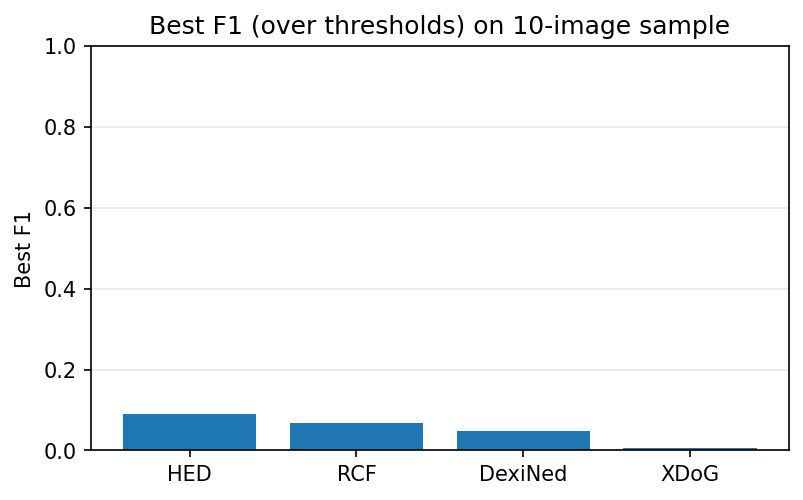

In [11]:
# ===== Edge metrics (Precision / Recall / F1 / IoU) on the 10-image sample =====
def compute_metrics_binary(pred_bin: np.ndarray, gt_bin: np.ndarray):
    # pred_bin, gt_bin: HxW {0,1}
    pred_bin = pred_bin.astype(np.uint8)
    gt_bin = gt_bin.astype(np.uint8)
    tp = int(np.sum((pred_bin == 1) & (gt_bin == 1)))
    fp = int(np.sum((pred_bin == 1) & (gt_bin == 0)))
    fn = int(np.sum((pred_bin == 0) & (gt_bin == 1)))
    tn = int(np.sum((pred_bin == 0) & (gt_bin == 0)))
    eps = 1e-9
    prec = tp / (tp + fp + eps)
    rec = tp / (tp + fn + eps)
    f1 = 2 * prec * rec / (prec + rec + eps)
    iou = tp / (tp + fp + fn + eps)
    return {'precision': prec, 'recall': rec, 'f1': f1, 'iou': iou, 'tp': tp, 'fp': fp, 'fn': fn, 'tn': tn}

rows = []
for model_name in MODEL_ORDER:
    if len(pred_cache.get(model_name, {})) == 0:
        continue
    for stem, pred01 in pred_cache[model_name].items():
        gt01 = gt_cache[stem]
        # Ensure alignment (same shape)
        if pred01.shape != gt01.shape:
            pred01 = np.array(Image.fromarray((pred01 * 255).astype(np.uint8)).resize((gt01.shape[1], gt01.shape[0]), resample=Image.BILINEAR)).astype(np.float32) / 255.0
        gt_bin = (gt01 >= 0.5).astype(np.uint8)
        for thr in THRESHOLDS:
            pred_bin = (pred01 >= float(thr)).astype(np.uint8)
            m = compute_metrics_binary(pred_bin, gt_bin)
            rows.append({
                'model': model_name,
                'image': stem,
                'thr': float(thr),
                'precision': m['precision'],
                'recall': m['recall'],
                'f1': m['f1'],
                'iou': m['iou'],
            })

df = pd.DataFrame(rows)
if df.empty:
    raise RuntimeError('No predictions available for metrics. At least XDoG should run.')

# Per-model averages per threshold
avg = df.groupby(['model', 'thr'], as_index=False)[['precision', 'recall', 'f1', 'iou']].mean()

# Build a wide summary table with P/R/F1 for each threshold + best-F1
summary = []
for model_name, g in avg.groupby('model'):
    rec = {'model': model_name}
    best_f1 = -1.0
    best_thr = None
    for thr in THRESHOLDS:
        row = g[g['thr'] == float(thr)]
        if row.empty:
            rec[f'P@{thr}'] = np.nan
            rec[f'R@{thr}'] = np.nan
            rec[f'F1@{thr}'] = np.nan
            continue
        p = float(row['precision'].iloc[0])
        r = float(row['recall'].iloc[0])
        f1 = float(row['f1'].iloc[0])
        rec[f'P@{thr}'] = p
        rec[f'R@{thr}'] = r
        rec[f'F1@{thr}'] = f1
        if f1 > best_f1:
            best_f1 = f1
            best_thr = thr
    rec['best_F1'] = best_f1
    rec['best_thr'] = best_thr
    summary.append(rec)

summary_df = pd.DataFrame(summary).sort_values('best_F1', ascending=False)
pd.set_option('display.precision', 4)
display(summary_df)

# Bar chart of best-F1 per model
plt.figure(figsize=(6, 3.5), dpi=150)
plt.bar(summary_df['model'], summary_df['best_F1'])
plt.title('Best F1 (over thresholds) on 10-image sample')
plt.ylabel('Best F1')
plt.ylim(0, 1)
plt.grid(axis='y', alpha=0.3)
plt.show()

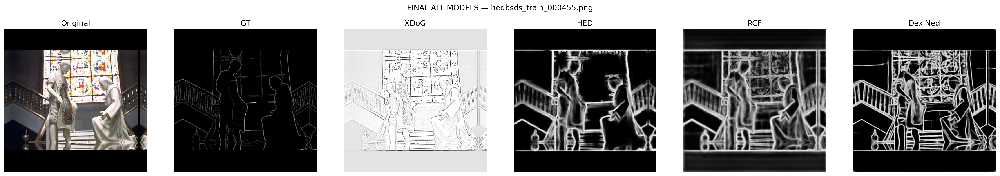

Saved final comparison to: E:\Edge Detection\Comparison\outputs\final\hedbsds_train_000455__FINAL_ALL.png


In [12]:
# ===== Final single-image ALL-models comparison (high-quality figure) =====
first_stem = sample_pairs[0][0].stem
img_path, gt_path = sample_pairs[0]
rgb = read_rgb(img_path)
gt01 = read_gt_mask(gt_path)

preds = {}
for model_name in MODEL_ORDER:
    pred_fn = predictors.get(model_name)
    if pred_fn is None:
        preds[model_name] = None
        continue
    try:
        preds[model_name] = np.clip(pred_fn(rgb).astype(np.float32), 0.0, 1.0)
    except Exception as e:
        print(f'[SKIP] {model_name} failed on final image: {e}')
        preds[model_name] = None

cols = ['Original', 'GT', 'XDoG', 'HED', 'RCF', 'DexiNed']
fig, axes = plt.subplots(1, len(cols), figsize=(3.8 * len(cols), 3.8), dpi=200)

def _show(ax, title, img, is_rgb=False):
    ax.set_title(title)
    ax.axis('off')
    if img is None:
        ax.text(0.5, 0.5, 'N/A', ha='center', va='center')
        return
    if is_rgb:
        ax.imshow(img)
    else:
        ax.imshow(img, cmap='gray', vmin=0.0, vmax=1.0)

_show(axes[0], 'Original', rgb, is_rgb=True)
_show(axes[1], 'GT', gt01, is_rgb=False)
_show(axes[2], 'XDoG', preds.get('XDoG'), is_rgb=False)
_show(axes[3], 'HED', preds.get('HED'), is_rgb=False)
_show(axes[4], 'RCF', preds.get('RCF'), is_rgb=False)
_show(axes[5], 'DexiNed', preds.get('DexiNed'), is_rgb=False)

fig.suptitle(f'FINAL ALL MODELS — {img_path.name}', y=1.02)
fig.tight_layout()
out_final = OUTPUTS_DIR_FINAL / f'{first_stem}__FINAL_ALL.png'
ensure_dir(out_final.parent)
fig.savefig(out_final, bbox_inches='tight')
plt.show()
plt.close(fig)

print('Saved final comparison to:', out_final.resolve())